# ERA5 1993-2023 EXTREME VALUE ANALYSIS

Notebook environment to Perform EVA on 30 yrs of ERA5 Data using GEV formula

In [22]:
# pip install --upgrade scipy

In [1]:
import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from itertools import compress
import pandas as pd
import scipy.stats

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
import os
import math

from tqdm import tqdm
from scipy.stats import genextreme


Cannot find header.dxf (GDAL_DATA is not defined)


In [121]:
df_unique_final=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore\ERA5_Final_Results\ERA5_30yr_RP.csv")
df_unique_final["indexa"]=df_unique_final.index
df_unique_final

,lat,lon,lat_lon,10_year_RP,50_year_RP,100_year_RP,indexa
0,-50.0,285.0,"(-50.0, 285.0)",4.931866,5.393544,5.581012,0
1,-47.5,285.0,"(-47.5, 285.0)",6.168892,6.496760,6.603720,1
2,-48.5,284.5,"(-48.5, 284.5)",6.212124,6.473361,6.546976,2
3,-49.0,284.5,"(-49.0, 284.5)",5.217976,5.580177,5.698893,3
4,-53.5,286.5,"(-53.5, 286.5)",4.417286,4.991034,5.253604,4
...,...,...,...,...,...,...,...
5922,65.0,37.5,"(65.0, 37.5)",3.926587,4.325531,4.458427,5922
5923,65.5,38.5,"(65.5, 38.5)",4.443398,4.820713,4.956323,5923
5924,66.0,39.0,"(66.0, 39.0)",4.594982,4.996120,5.128148,5924
5925,65.0,37.0,"(65.0, 37.0)",3.637266,3.873627,3.936478,5925


In [ ]:
df_unique_final["indexa"]=df_unique_final.index

In [39]:
# Plot using Plotly Express
fig = px.scatter_mapbox(df_unique_final,
                        lat='lat',
                        lon='lon',
                        color="100_year_RP",
                        hover_data="indexa",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=22.5, lon=285.5), zoom=0.2))
fig.show()

In [31]:
Annual_max_30yrs=xr.open_dataset("Annual_max_30yrs.nc")
Annual_max_30yrs

<xarray.Dataset>
Dimensions:    (longitude: 5927, latitude: 5927, time: 31)
Coordinates:
  * longitude  (longitude) float32 285.0 285.0 284.5 284.5 ... 39.0 37.0 38.0
  * latitude   (latitude) float32 -50.0 -47.5 -48.5 -49.0 ... 66.0 65.0 65.5
  * time       (time) datetime64[ns] 1993-12-31 1994-12-31 ... 2023-12-31
Data variables:
    swh        (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-03-25 17:20:46 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [32]:
var="swh"

In [33]:
def reverse_longitude_converter(lon):
    if lon > 180:
        lon = lon - 360
    else:
        lon = lon
    return lon

[2.37496   2.3981972 2.4278173 2.4579935 2.5020876 2.5454183 2.5633345
 2.5638685 2.587811  2.5929422 2.609995  2.6534166 2.6851945 2.6907225
 2.900426  2.9143682 3.2087965 3.2725277 3.3863125 3.4742246 3.6334367
 4.143061  4.565434  4.7231326 5.1218824 5.6098595 5.759815  6.85939
 6.8869643 7.5118847 9.0024605]
[ 1.          1.03333333  1.06896552  1.10714286  1.14814815  1.19230769
  1.24        1.29166667  1.34782609  1.40909091  1.47619048  1.55
  1.63157895  1.72222222  1.82352941  1.9375      2.06666667  2.21428571
  2.38461538  2.58333333  2.81818182  3.1         3.44444444  3.875
  4.42857143  5.16666667  6.2         7.75       10.33333333 15.5
 31.        ]


Text(0.5, 1.0, 'ERA5 1993-2023 GEV Return Period plot at latitude 22.5 and longitude -74.5')

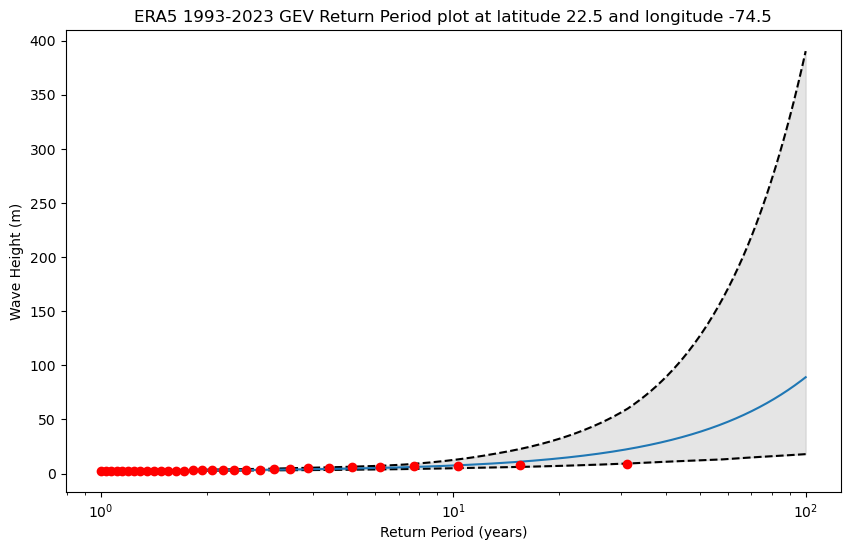

In [42]:
ann_max=Annual_max_30yrs.isel(latitude=3459,longitude=3459)
lat=ann_max.latitude.values+0
lon=ann_max.longitude.values+0

data=ann_max[var].to_numpy()
data

x = np.sort(data)
print (x)
y = np.arange(1, len(x) + 1)
y_rp=((y[::-1])/len(y))**-1
print (y_rp)

bootstrap_samples=100
# initalize list to store parameters from samples
params = []

# generate 1000 samples by resampling data with replacement
for i in range(bootstrap_samples):
    params.append(
        genextreme.fit(np.random.choice(data, size=data.size, replace=True))
    )



# generate years vector
years = np.arange(0.1, 100, 0.01)

# intialize list for return levels
levels = []

# calculate return levels for each of the 1000 samples
for i in range(bootstrap_samples):
    levels.append(genextreme.ppf(1 - 1 / years, *params[i]))
levels = np.array(levels)

# setup plots
fig, ax = plt.subplots(figsize=(10, 6))





# plot confidence intervals
_ = ax.plot(years, np.quantile(levels, [0.025, 0.975], axis=0).T, "k--")
_ = ax.fill_between(years, np.quantile(levels, 0.025, axis=0).T, np.quantile(levels, 0.975, axis=0).T, color='gray', alpha=0.2, label='Confidence Intervals')

# plot return mean levels
_ = ax.plot(years, levels.mean(axis=0))

# find empirical return levels
_ = ax.plot(y_rp, x, 'ro', label='Return Levels')

# aesthetics
# ax.set_xlim(0, 100)
# ax.set_ylim(np.floor(min(x))-.5, np.ceil(max(x))+.5)
ax.set_xscale("log")
ax.set_xlabel('Return Period (years)')
ax.set_ylabel('Wave Height (m)')

ax.set_title(f'ERA5 1993-2023 GEV Return Period plot at latitude {lat} and longitude {reverse_longitude_converter(lon)}')


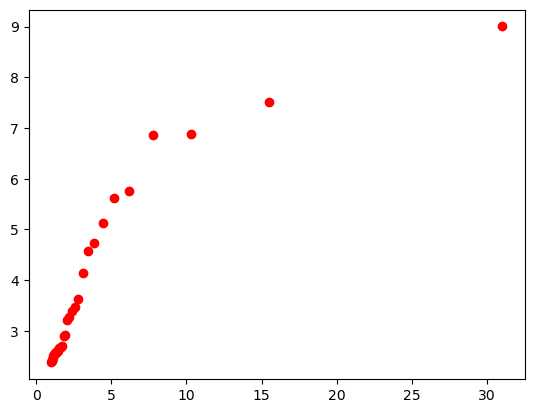

In [51]:
plt.plot(y_rp, x, 'ro', label='Return Levels')

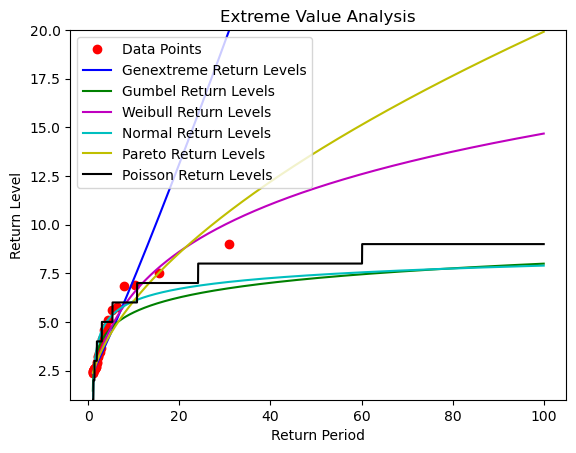

In [103]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import genextreme, gumbel_r, weibull_min, norm, pareto, poisson

# Assuming x and y_rp are your data arrays
plt.plot(y_rp, x, 'ro', label='Data Points') # Plot data points

# Fit Genextreme distribution
a, b, c = genextreme.fit(x)

# Define return periods
return_periods = np.arange(0.1, 100, 0.01)

# Calculate return levels for Genextreme distribution
return_levels_genextreme = genextreme.isf(1/return_periods, a, b, c)

# Fit Gumbel distribution
params_gumbel = gumbel_r.fit(x)

# Calculate return levels for Gumbel distribution
return_levels_gumbel = gumbel_r.isf(1/return_periods, *params_gumbel)

# Fit Weibull distribution
params_weibull = weibull_min.fit(x)

# Calculate return levels for Weibull distribution
return_levels_weibull = weibull_min.isf(1/return_periods, *params_weibull)

# Fit Normal distribution
mu, sigma = norm.fit(x)

# Calculate return levels for Normal distribution
return_levels_normal = norm.isf(1/return_periods, loc=mu, scale=sigma)

# Fit Pareto distribution
params_pareto = pareto.fit(x)

# Calculate return levels for Pareto distribution
return_levels_pareto = pareto.isf(1/return_periods, *params_pareto)

# Estimate Poisson parameter based on the mean of the data
lambda_poisson = np.mean(x)

# Calculate return levels for Poisson distribution
return_levels_poisson = poisson.isf(1/return_periods, lambda_poisson)

# Plot return levels for Genextreme distribution
plt.plot(return_periods, return_levels_genextreme, 'b', label='Genextreme Return Levels')

# Plot return levels for Gumbel distribution
plt.plot(return_periods, return_levels_gumbel, 'g', label='Gumbel Return Levels')

# Plot return levels for Weibull distribution
plt.plot(return_periods, return_levels_weibull, 'm', label='Weibull Return Levels')

# Plot return levels for Normal distribution
plt.plot(return_periods, return_levels_normal, 'c', label='Normal Return Levels')

# Plot return levels for Pareto distribution
plt.plot(return_periods, return_levels_pareto, 'y', label='Pareto Return Levels')

# Plot return levels for Poisson distribution
plt.plot(return_periods, return_levels_poisson, 'k', label='Poisson Return Levels')

# Label axes and add title
plt.xlabel('Return Period')
plt.ylabel('Return Level')
plt.title('Extreme Value Analysis')
plt.ylim(1,20)

# Add legend and display plot
plt.legend()
plt.show()


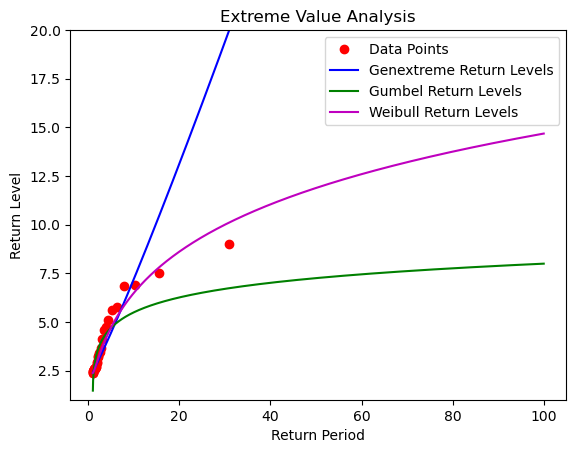

In [99]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import genextreme, gumbel_l,weibull_min

# Assuming x and y_rp are your data arrays
plt.plot(y_rp, x, 'ro', label='Data Points') # Plot data points

# Fit Genextreme distribution
a,b,c = genextreme.fit(x)

# Define return periods
return_periods =  np.arange(0.1, 100, 0.01)

# Calculate return levels for Genextreme distribution
return_levels = genextreme.isf(1/return_periods, a,b,c)


# Fit Weibull distribution
params_weibull = weibull_min.fit(x)

# Calculate return levels for Weibull distribution
return_levels_weibull = weibull_min.isf(1/return_periods, *params_weibull)

# Fit Gumbel distribution
params_gumbel = gumbel_r.fit(x)

# Calculate return levels for Gumbel distribution
return_levels_gumbel = gumbel_r.isf(1/return_periods, *params_gumbel)

# Plot return levels for Genextreme distribution
plt.plot(return_periods, return_levels, 'b', label='Genextreme Return Levels')

# Plot return levels for Gumbel distribution
plt.plot(return_periods, return_levels_gumbel, 'g', label='Gumbel Return Levels')

# Plot return levels for Weibull distribution
plt.plot(return_periods, return_levels_weibull, 'm', label='Weibull Return Levels')

# Label axes and add title
plt.xlabel('Return Period')
plt.ylabel('Return Level')
plt.title('Extreme Value Analysis')
plt.ylim(1,20)

# Add legend and display plot
plt.legend()
plt.show()


In [68]:
print(params_gumbel)
print(params_genex)

(3.0960932681366793, 1.064883410930618)
(-1.0999501741904214, 2.703350521551005, 0.4547143432563622)


Text(0.5, 1.0, 'ERA5 1993-2023 GEV Return Period plot at latitude -39.5 and longitude 148.0')

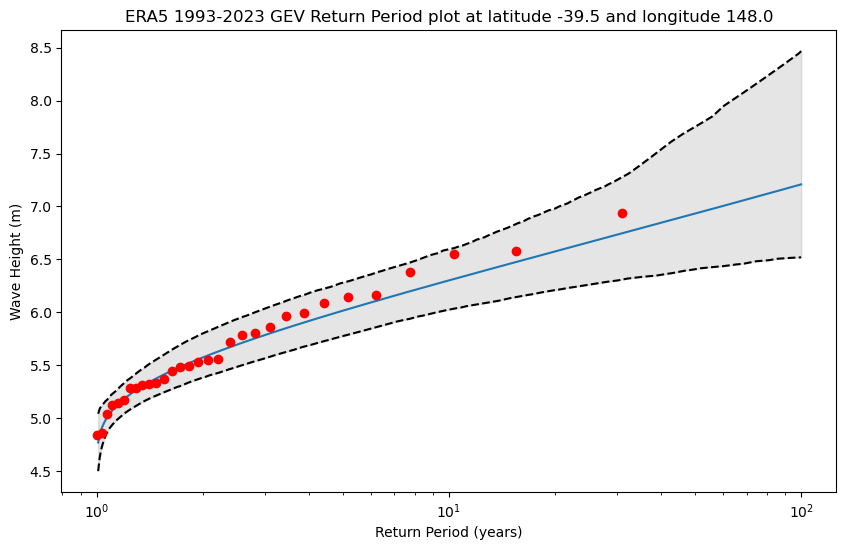

In [106]:
ann_max=Annual_max_30yrs.isel(latitude=349,longitude=349)
lat=ann_max.latitude.values+0
lon=ann_max.longitude.values+0

data=ann_max[var].to_numpy()
data

x = np.sort(data)
y = np.arange(1, len(x) + 1)
y_rp=((y[::-1])/len(y))**-1

bootstrap_samples=100
# initalize list to store parameters from samples
params = []

# generate 1000 samples by resampling data with replacement
for i in range(bootstrap_samples):
    params.append(
        genextreme.fit(np.random.choice(data, size=data.size, replace=True))
    )



# generate years vector
years = np.arange(0.1, 100, 0.01)

# intialize list for return levels
levels = []

# calculate return levels for each of the 1000 samples
for i in range(bootstrap_samples):
    levels.append(genextreme.ppf(1 - 1 / years, *params[i]))
levels = np.array(levels)

# setup plots
fig, ax = plt.subplots(figsize=(10, 6))





# plot confidence intervals
_ = ax.plot(years, np.quantile(levels, [0.025, 0.975], axis=0).T, "k--")
_ = ax.fill_between(years, np.quantile(levels, 0.025, axis=0).T, np.quantile(levels, 0.975, axis=0).T, color='gray', alpha=0.2, label='Confidence Intervals')

# plot return mean levels
_ = ax.plot(years, levels.mean(axis=0))

# find empirical return levels
_ = ax.plot(y_rp, x, 'ro', label='Return Levels')

# aesthetics
# ax.set_xlim(0, 100)
# ax.set_ylim(np.floor(min(x))-.5, np.ceil(max(x))+.5)
ax.set_xscale("log")
ax.set_xlabel('Return Period (years)')
ax.set_ylabel('Wave Height (m)')

ax.set_title(f'ERA5 1993-2023 GEV Return Period plot at latitude {lat} and longitude {reverse_longitude_converter(lon)}')


In [177]:
df_unique_final=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore\ERA5_Final_Results\ERA5_30yr_RP.csv")
df_unique_final["indexa"]=df_unique_final.index
df_unique_final

,lat,lon,lat_lon,10_year_RP,50_year_RP,100_year_RP,indexa
0,-50.0,285.0,"(-50.0, 285.0)",4.931866,5.393544,5.581012,0
1,-47.5,285.0,"(-47.5, 285.0)",6.168892,6.496760,6.603720,1
2,-48.5,284.5,"(-48.5, 284.5)",6.212124,6.473361,6.546976,2
3,-49.0,284.5,"(-49.0, 284.5)",5.217976,5.580177,5.698893,3
4,-53.5,286.5,"(-53.5, 286.5)",4.417286,4.991034,5.253604,4
...,...,...,...,...,...,...,...
5922,65.0,37.5,"(65.0, 37.5)",3.926587,4.325531,4.458427,5922
5923,65.5,38.5,"(65.5, 38.5)",4.443398,4.820713,4.956323,5923
5924,66.0,39.0,"(66.0, 39.0)",4.594982,4.996120,5.128148,5924
5925,65.0,37.0,"(65.0, 37.0)",3.637266,3.873627,3.936478,5925


In [178]:
df_unique_final = df_unique_final.rename(columns={df_unique_final.columns[3]: "30_year_RP"})
df_unique_final["EVA_Type"]="x"
df_unique_final["EVA_color"]=0
df_unique_final["30_yr_RP_measured"]=0.0
df_unique_final.iloc[:,3:6]=np.nan
df_unique_final

,lat,lon,lat_lon,30_year_RP,50_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured
0,-50.0,285.0,"(-50.0, 285.0)",NaN,NaN,NaN,0,x,0,0.0
1,-47.5,285.0,"(-47.5, 285.0)",NaN,NaN,NaN,1,x,0,0.0
2,-48.5,284.5,"(-48.5, 284.5)",NaN,NaN,NaN,2,x,0,0.0
3,-49.0,284.5,"(-49.0, 284.5)",NaN,NaN,NaN,3,x,0,0.0
4,-53.5,286.5,"(-53.5, 286.5)",NaN,NaN,NaN,4,x,0,0.0
...,...,...,...,...,...,...,...,...,...,...
5922,65.0,37.5,"(65.0, 37.5)",NaN,NaN,NaN,5922,x,0,0.0
5923,65.5,38.5,"(65.5, 38.5)",NaN,NaN,NaN,5923,x,0,0.0
5924,66.0,39.0,"(66.0, 39.0)",NaN,NaN,NaN,5924,x,0,0.0
5925,65.0,37.0,"(65.0, 37.0)",NaN,NaN,NaN,5925,x,0,0.0


In [179]:
from scipy.stats import genextreme,weibull_min,gumbel_r
#run loop for each nearshore ERA5 point

bootstrap_samples=100
thresh=5

for i in tqdm(range(len(Annual_max_30yrs.latitude.values)),desc="Points calculated"):

    ann_max=Annual_max_30yrs.isel(latitude=i,longitude=i)
    lat=ann_max.latitude.values+0
    lon=ann_max.longitude.values+0

    data=ann_max[var].to_numpy()
    data

    if np.all(np.isnan(data)):
      continue
 #Calc the return periods
    # Fit the GEV distribution to the data
    shape, loc, scale = genextreme.fit(data)
    # Fit Weibull distribution
    params_weibull = weibull_min.fit(data)
    # Fit gumbel distribution
    params_gumbel = gumbel_r.fit(data)    

   #30 year return period check
    check_year=len(data)
    yr_30_gev=genextreme.isf(1/check_year, shape, loc, scale) 
    yr_30_wei = weibull_min.isf(1/check_year, *params_weibull)
    yr_30_gum = gumbel_r.isf(1/check_year, *params_gumbel)


    difference_gev=np.abs(yr_30_gev-max(data))
    difference_wei=np.abs(yr_30_wei-max(data))
    difference_gum=np.abs(yr_30_gum-max(data))


    # Calculate the return levels for the specified return periods
    return_periods = np.array([30, 50, 100])
    if difference_gev>thresh:
         if difference_wei<difference_gum:
            # Calculate return levels for Weibull distribution
            return_levels = weibull_min.isf(1/return_periods, *params_weibull)
            fit_type="weibull"
            df_unique_final.iloc[i,8]=1
         else:
            # Calculate return levels for Weibull distribution
            return_levels = gumbel_r.isf(1/return_periods, *params_gumbel)
            fit_type="gumbel"
            df_unique_final.iloc[i,8]=2            
    else:
      return_levels = genextreme.isf(1/return_periods, shape, loc, scale)
      fit_type="GEV"

    df_unique_final.iloc[i,3]=return_levels[0]
    df_unique_final.iloc[i,4]=return_levels[1]
    df_unique_final.iloc[i,5]=return_levels[2]
    df_unique_final.iloc[i,7]=fit_type
    df_unique_final.iloc[i,9]=max(data)
    

    
   #  if i % 30 == 0:
    if difference_gev>thresh:
      x = np.sort(data)
      y = np.arange(1, len(x) + 1)
      y_rp=((y[::-1])/len(y))**-1

      print(difference_wei,difference_gum)
      # initalize list to store parameters from samples
      params = []

      #if
      if difference_gev>thresh:
         for i in range(bootstrap_samples):
            if difference_wei<difference_gum:
               params.append(weibull_min.fit(np.random.choice(data, size=data.size, replace=True)))   
            else:
               params.append(gumbel_r.fit(np.random.choice(data, size=data.size, replace=True)))   
      else:
      # generate 1000 samples by resampling data with replacement
         for i in range(bootstrap_samples):
            params.append(
               genextreme.fit(np.random.choice(data, size=data.size, replace=True))
            )
      



      # generate years vector
      years = np.arange(0.1, 100, 0.01)

      # intialize list for return levels
      levels = []


      # calculate return levels for each of the 1000 samples
      if difference_gev>thresh  :
         for i in range(bootstrap_samples):
            if difference_wei<difference_gum:
               levels.append(weibull_min.isf( 1 / years, *params[i]))
            else:
               levels.append(gumbel_r.isf( 1 / years, *params[i]))  
      else:
         for i in range(bootstrap_samples):
            levels.append(genextreme.isf( 1 / years, *params[i]))
      


      levels = np.array(levels)       

      #Setup_plot for all distribution types REGARDLESS
      levels_regardless_genex = []
      params_regardless_genex=[]
      for i in range(bootstrap_samples):
         params_regardless_genex.append(
         genextreme.fit(np.random.choice(data, size=data.size, replace=True))
            )
         levels_regardless_genex.append(genextreme.isf( 1 / years, *params_regardless_genex[i]))

      levels_regardless_genex = np.array(levels_regardless_genex)

      #Weibul
      levels_regardless_wei = []
      params_regardless_wei=[]
      for i in range(bootstrap_samples):
         params_regardless_wei.append(
         weibull_min.fit(np.random.choice(data, size=data.size, replace=True))
            )
         levels_regardless_wei.append(weibull_min.isf( 1 / years, *params_regardless_wei[i]))

      levels_regardless_wei = np.array(levels_regardless_wei)   

      #GUMBEL
      levels_regardless_gum = []
      params_regardless_gum=[]
      for i in range(bootstrap_samples):
         params_regardless_gum.append(
         gumbel_r.fit(np.random.choice(data, size=data.size, replace=True))
            )
         levels_regardless_gum.append(gumbel_r.isf( 1 / years, *params_regardless_gum[i]))

      levels_regardless_gum = np.array(levels_regardless_gum)      

      
      # setup plots
      fig, ax = plt.subplots(figsize=(10, 6))





      # plot confidence intervals
      _ = ax.plot(years, np.quantile(levels, [0.025, 0.975], axis=0).T, "k--")
      _ = ax.fill_between(years, np.quantile(levels, 0.025, axis=0).T, np.quantile(levels, 0.975, axis=0).T, color='gray', alpha=0.2, label='Confidence Intervals (2.5% to 97.5%)')

      # plot GEV return mean levels
      _ = ax.plot(years, levels_regardless_genex.mean(axis=0),label='Fitted GEV Wave Height - Median')

      # plot gumbel return mean levels
      _ = ax.plot(years, levels_regardless_gum.mean(axis=0),label='Fitted gumbel Wave Height - Median')      

      # plot weibull return mean levels
      _ = ax.plot(years, levels_regardless_wei.mean(axis=0),label='Fitted weibull Wave Height - Median')         

      # plot return mean levels
      _ = ax.plot(years, levels.mean(axis=0),label=f'Actual Fit type: {fit_type} Wave Height - Median')

      # find empirical return levels
      _ = ax.plot(y_rp, x, 'ro', label='ERA5 Reanalyzed Offshore Wave Height')

      # aesthetics
      # ax.set_xlim(0, 100)
      # ax.set_ylim(np.floor(min(x))-.5, np.ceil(max(x))+.5)
      ax.set_xscale("log")
      ax.set_xlabel('Return Period (years)')
      ax.set_ylabel('Wave Height (m)')

      ax.set_title(f'ERA5 1993-2023 {fit_type} Return Period plot at latitude {lat} and longitude {reverse_longitude_converter(lon)}')

      # Save plot as PNG
      file_name=f'\ERA5 1993-2023 {fit_type} RP lat_{lat}_lon_{reverse_longitude_converter(lon)}.png'
      plt.legend(loc="best")
      plt.savefig(r"abnormal_RP_fig"+file_name)

      # Close the current figure to avoid warnings
      plt.close()

# plt.show()
df_unique_final


Points calculated:   0%|          | 0/5927 [00:00<?, ?it/s]

Points calculated:  42%|████▏     | 2494/5927 [02:38<04:02, 14.17it/s]

4.375283544729495 6.051264308130749


Points calculated:  52%|█████▏    | 3073/5927 [03:23<02:45, 17.23it/s]  

0.5856289000730683 0.8000010357718423


Points calculated:  53%|█████▎    | 3169/5927 [03:38<02:28, 18.63it/s]  

3.8184044102684602 0.518705168701656


Points calculated:  56%|█████▌    | 3306/5927 [03:53<02:28, 17.62it/s]

0.31881364554309144 3.161709312202314


Points calculated:  57%|█████▋    | 3351/5927 [04:07<02:39, 16.11it/s]  

2.36266183178558 0.8791508222173761


Points calculated:  57%|█████▋    | 3389/5927 [04:18<02:48, 15.08it/s]

5.745465092776542 7.080977952838881


Points calculated:  58%|█████▊    | 3414/5927 [04:28<03:43, 11.26it/s]  

3.1461582752634776 2.996014378576545


Points calculated:  58%|█████▊    | 3458/5927 [04:40<02:53, 14.24it/s]

1.118513143471226 2.2669785519475116


Points calculated:  58%|█████▊    | 3461/5927 [04:51<57:21,  1.40s/it]  

3.786662345121103 2.2609094162979613


Points calculated:  59%|█████▉    | 3495/5927 [05:01<03:13, 12.54it/s]  

0.2521282038353254 0.9672333334309737


Points calculated:  59%|█████▉    | 3503/5927 [05:12<23:53,  1.69it/s]  

0.7046363384687533 1.0849044191362305


Points calculated: 100%|██████████| 5927/5927 [07:46<00:00, 12.72it/s]  


,lat,lon,lat_lon,30_year_RP,50_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured
0,-50.0,285.0,"(-50.0, 285.0)",5.251639,5.393544,5.581012,0,GEV,0,5.738188
1,-47.5,285.0,"(-47.5, 285.0)",6.406324,6.496760,6.603720,1,GEV,0,6.627725
2,-48.5,284.5,"(-48.5, 284.5)",6.406474,6.473361,6.546976,2,GEV,0,6.485739
3,-49.0,284.5,"(-49.0, 284.5)",5.480035,5.580177,5.698893,3,GEV,0,5.796894
4,-53.5,286.5,"(-53.5, 286.5)",4.804242,4.991034,5.253604,4,GEV,0,5.535233
...,...,...,...,...,...,...,...,...,...,...
5922,65.0,37.5,"(65.0, 37.5)",4.214329,4.325531,4.458427,5922,GEV,0,4.635912
5923,65.5,38.5,"(65.5, 38.5)",4.711481,4.820713,4.956323,5923,GEV,0,4.916862
5924,66.0,39.0,"(66.0, 39.0)",4.884980,4.996120,5.128148,5924,GEV,0,4.996535
5925,65.0,37.0,"(65.0, 37.0)",3.814891,3.873627,3.936478,5925,GEV,0,3.963868


In [180]:
# Plot using Plotly Express
fig = px.scatter_mapbox(df_unique_final,
                        lat='lat',
                        lon='lon',
                        color="EVA_color",
                        hover_data="100_year_RP",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat, lon=lon), zoom=0.2))
fig.show()

In [181]:
# Plot using Plotly Express
fig = px.scatter_mapbox(df_unique_final,
                        lat='lat',
                        lon='lon',
                        color="100_year_RP",
                        hover_data="30_yr_RP_measured",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat, lon=lon), zoom=0.2))
fig.show()

In [105]:
np.arange(1, len(x) + 1)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])

In [20]:
np.any(pd.isna(df_unique_final["100_year_RP"]))

True

In [21]:
df_with_nans = df_unique_final[df_unique_final["100_year_RP"].isna()]
df_with_nans

,lat,lon,lat_lon,10_year_RP,50_year_RP,100_year_RP
5120,57.5,267.5,"(57.5, 267.5)",NaN,NaN,NaN
5121,57.0,269.5,"(57.0, 269.5)",NaN,NaN,NaN
5122,57.0,269.0,"(57.0, 269.0)",NaN,NaN,NaN
5124,57.0,267.5,"(57.0, 267.5)",NaN,NaN,NaN
5125,57.0,268.5,"(57.0, 268.5)",NaN,NaN,NaN
5126,57.0,268.0,"(57.0, 268.0)",NaN,NaN,NaN
5128,57.0,270.0,"(57.0, 270.0)",NaN,NaN,NaN
5130,55.5,274.5,"(55.5, 274.5)",NaN,NaN,NaN
5131,53.0,278.0,"(53.0, 278.0)",NaN,NaN,NaN
5134,53.0,281.5,"(53.0, 281.5)",NaN,NaN,NaN


In [22]:
df_unique_final

,lat,lon,lat_lon,10_year_RP,50_year_RP,100_year_RP
0,-50.0,285.0,"(-50.0, 285.0)",4.931866,5.393544,5.581012
1,-47.5,285.0,"(-47.5, 285.0)",6.168892,6.496760,6.603720
2,-48.5,284.5,"(-48.5, 284.5)",6.212124,6.473361,6.546976
3,-49.0,284.5,"(-49.0, 284.5)",5.217976,5.580177,5.698893
4,-53.5,286.5,"(-53.5, 286.5)",4.417286,4.991034,5.253604
...,...,...,...,...,...,...
5923,65.0,37.5,"(65.0, 37.5)",3.926587,4.325531,4.458427
5924,65.5,38.5,"(65.5, 38.5)",4.443398,4.820713,4.956323
5925,66.0,39.0,"(66.0, 39.0)",4.594982,4.996120,5.128148
5926,65.0,37.0,"(65.0, 37.0)",3.637266,3.873627,3.936478


In [182]:
# Plot using Plotly Express
fig = px.scatter_mapbox(df_unique_final,
                        lat='lat',
                        lon='lon',
                        color="100_year_RP",
                        hover_data="100_year_RP",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat, lon=lon), zoom=0.2))
fig.show()

In [183]:
df_unique_final.to_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore\ERA5_Final_Results\ERA5_30yr_RP_adjusted.csv",index=None)

In [184]:
df_final=pd.read_csv("All_Transects_ERA5map_ERA5_2014_2.csv")
df_final

,Unnamed: 0.1,Unnamed: 0,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,near_lat,near_lon,Lat_Lon
0,0,0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,-50.387456,-50.0,285.0,"(-50.0, 285.0)"
1,1,1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,-50.388940,-50.0,285.0,"(-50.0, 285.0)"
2,2,2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,-50.390425,-50.0,285.0,"(-50.0, 285.0)"
3,3,3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,-50.391574,-50.0,285.0,"(-50.0, 285.0)"
4,4,4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,-50.393348,-50.0,285.0,"(-50.0, 285.0)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739821,1739821,1739821,BOX_211_067_149,RUS,Europe,Russia,39.929937,64.701462,39.935198,64.698350,39.940460,64.695238,66.0,39.0,"(66.0, 39.0)"
1739822,1739822,1739822,BOX_211_067_150,RUS,Europe,Russia,39.933577,64.702586,39.938839,64.699474,39.944100,64.696363,66.0,39.0,"(66.0, 39.0)"
1739823,1739823,1739823,BOX_211_067_151,RUS,Europe,Russia,39.935546,64.703502,39.942003,64.700833,39.948460,64.698164,66.0,39.0,"(66.0, 39.0)"
1739824,1739824,1739824,BOX_211_067_152,RUS,Europe,Russia,39.937050,64.704370,39.944697,64.702356,39.952343,64.700341,66.0,39.0,"(66.0, 39.0)"


In [185]:
df_unique_final=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore\ERA5_Final_Results\ERA5_30yr_RP_adjusted.csv")

In [186]:
df_final_merged = pd.merge(left=df_final, right=df_unique_final, left_on="Lat_Lon", right_on="lat_lon")
df_final_merged


,Unnamed: 0.1,Unnamed: 0,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,...,lat,lon,lat_lon,30_year_RP,50_year_RP,100_year_RP,indexa,EVA_Type,EVA_color,30_yr_RP_measured
0,0,0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,...,-50.0,285.0,"(-50.0, 285.0)",5.251639,5.393544,5.581012,0,GEV,0,5.738188
1,1,1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,...,-50.0,285.0,"(-50.0, 285.0)",5.251639,5.393544,5.581012,0,GEV,0,5.738188
2,2,2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,...,-50.0,285.0,"(-50.0, 285.0)",5.251639,5.393544,5.581012,0,GEV,0,5.738188
3,3,3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,...,-50.0,285.0,"(-50.0, 285.0)",5.251639,5.393544,5.581012,0,GEV,0,5.738188
4,4,4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,...,-50.0,285.0,"(-50.0, 285.0)",5.251639,5.393544,5.581012,0,GEV,0,5.738188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739644,1739643,1739643,BOX_211_063_37,RUS,Europe,Russia,38.247262,64.839613,38.246713,64.843425,...,65.5,38.0,"(65.5, 38.0)",4.929294,5.073600,5.256056,5926,GEV,0,5.310472
1739645,1739644,1739644,BOX_211_063_38,RUS,Europe,Russia,38.242779,64.839497,38.242230,64.843309,...,65.5,38.0,"(65.5, 38.0)",4.929294,5.073600,5.256056,5926,GEV,0,5.310472
1739646,1739645,1739645,BOX_211_063_39,RUS,Europe,Russia,38.238045,64.839397,38.237745,64.843214,...,65.5,38.0,"(65.5, 38.0)",4.929294,5.073600,5.256056,5926,GEV,0,5.310472
1739647,1739646,1739646,BOX_211_063_40,RUS,Europe,Russia,38.233556,64.839333,38.233255,64.843150,...,65.5,38.0,"(65.5, 38.0)",4.929294,5.073600,5.256056,5926,GEV,0,5.310472


In [187]:
import plotly.express as px

lat = 18.1
lon = -77.3
view_width = 10

# Filter dataframe within specified range
filtered_df = df_final_merged[
    (df_final_merged["Intersect_lon"] < lon + view_width) & 
    (df_final_merged["Intersect_lon"] > lon - view_width) & 
    (df_final_merged["Intersect_lat"] < lat + view_width) & 
    (df_final_merged["Intersect_lat"] > lat - view_width)
]

# Plot using Plotly Express
fig = px.scatter_mapbox(filtered_df,
                        lat='Intersect_lat',
                        lon='Intersect_lon',
                        color="100_year_RP",
                        hover_data="100_year_RP",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat, lon=lon), zoom=5),title="100 yr Wave_Height Return-Period Distribution along Jamaica's shoreline")
fig.show()

In [203]:
import plotly.express as px

lat = 18.1
lon = -77.3
view_width = 10

# Filter dataframe within specified range
filtered_df = df_final_merged[
    (df_final_merged["Intersect_lon"] < lon + 18) & 
    (df_final_merged["Intersect_lon"] > lon - 7.5) & 
    (df_final_merged["Intersect_lat"] < lat + 9) & 
    (df_final_merged["Intersect_lat"] > lat - 8)
]

# Plot using Plotly Express
fig = px.scatter_mapbox(filtered_df,
                        lat='Intersect_lat',
                        lon='Intersect_lon',
                        color="100_year_RP",
                        hover_data="100_year_RP",
                        mapbox_style="carto-positron",width=1000,
                        height=600)

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=4),title="100 yr Wave_Height Return-Period Distribution along Caribbean's shoreline")
fig.show()

In [189]:
df_final_merged.to_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore\ERA5_Final_Results\ERA5_30yr_RP_GLOBAL_Transect_adjusted.csv")